# DATA REDUCTION PIPELINE

In summer 2023, I spent 2 months in Argentina observing distant galaxies in the Zone of Avoidance. This section of the sky is heavily obscured by gas and dust from the milkyway bulge and has made it very difficult to conduct extragalactic research in that part of the sky. This program is for the data reduction of the first night of data taken at the remote Cesco observatory in the Andes mountain range. The data is not publically available but the methods used in this reduction are applicable to many datasets.

In [51]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits 
from tqdm import tqdm
plt.rcParams['font.family'] = 'Courier New'

In [58]:
def load_fits(file):
    '''
    loads fits data from a file and outputs the header and data
    Parameters
    ----------
    file_path: string
        filename including path to a fits file
    Returns
    -------
    data: np.ndarray[np.float64]
        NxM array of intensities
    '''
    with fits.open(file) as hdu:
        data = hdu[0].data.astype(np.float64)
        
    return data

def load_data_cube(path):
    '''
    searches for all data fits files in a directory and loads them into a numpy 3D data cube
    Parameters
    ----------
    path: string
        path to directory with fits files, will search for all files of specified extension
    Returns
    -------
    data_cube: np.ndarray[np.float64]
        ixMxN array where each i index corresponds to a different fits data file
        each data file is transposed into a MxN matrix
    Example
    -------
    search for all fits files starting with 'HST' with .fits extention
        path = 'Spectro-Module/raw/HST*.fits'
    '''
    # searches for all files within a directory
    fits_files = sorted(glob.glob(path))
    # allocate ixMxN data cube array
    i = len(fits_files)
    data = load_fits(fits_files[0])
    data_cube = np.zeros((i, data.shape[0], data.shape[1]))
    # save first file to data arrays
    data_cube[0,:,:] = data
    # loop through each array in data list and store in data cube
    for i in tqdm(range(1, len(fits_files))):
        data = load_fits(fits_files[i])
        data_cube[i,:,:] = data
        
    return data_cube

def imshow(image, label=None):
    '''
    Display fits file with plt.imshow
    Parameters
    ----------
    image: np.ndarray[np.float64]
        NxM fits file
    label: str
        figure title
    '''
    plt.figure(figsize=(7,7))
    plt.imshow(image, vmin=np.percentile(image, 1), vmax=np.percentile(image, 95), 
                  cmap='viridis', origin='lower')
    if label != None:
        plt.title(label, size=15)
    plt.show()

100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 18.40it/s]


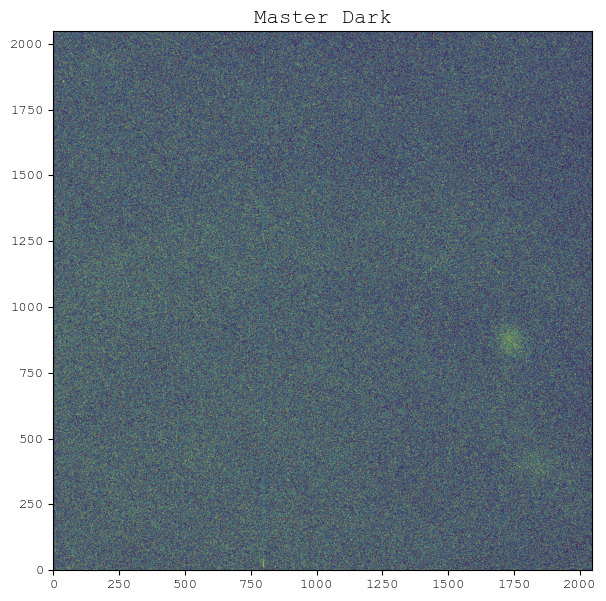

100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 18.18it/s]


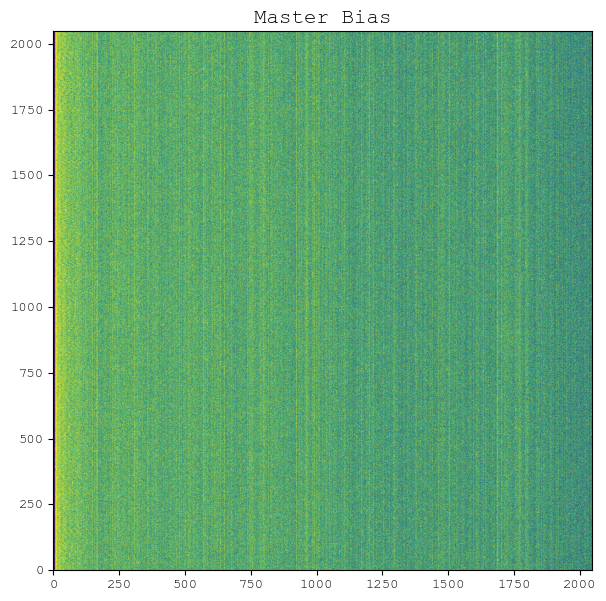

100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 20.36it/s]


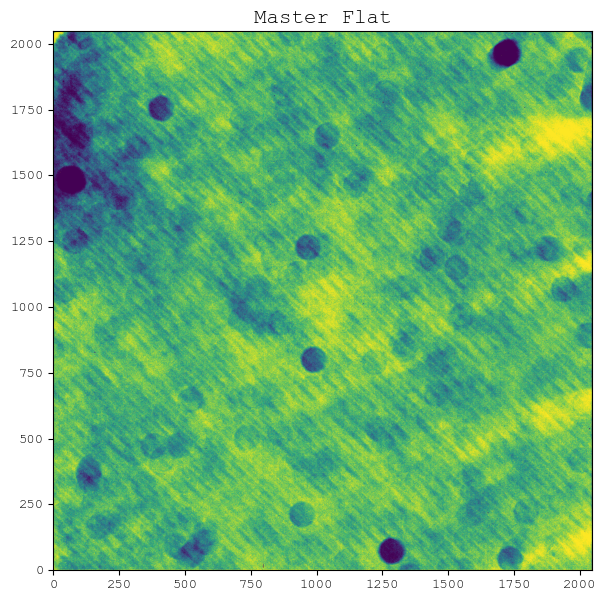

In [61]:
# calibration frames
'''
dark calibration frames
-----------------------
'''
darks_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/dark/*.fit'
raw_darks_cube = load_data_cube(darks_files)
master_dark = np.median(raw_darks_cube, axis=0)
imshow(master_dark, label='Master Dark')

'''
bias calibration frames
----------------------- 
'''
bias_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/bias/*.fit'
raw_bias_cube = load_data_cube(bias_files)
master_bias = np.median(raw_bias_cube, axis=0)
imshow(master_bias, label='Master Bias')

'''
flat calibration frames
----------------------- 
'''
flats_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/flat/*.fit'
raw_flats_cube = load_data_cube(flats_files)
# bias subtract
raw_flats_cube -= master_bias
# median combine flats
median_flat = np.median(raw_flats_cube, axis=0)
# normalize master flat
master_flat = median_flat/np.median(median_flat)
imshow(master_flat, label='Master Flat')

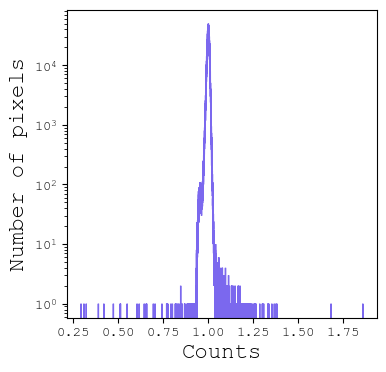

In [62]:
# check if master flat is normalized
fig = plt.figure(figsize = (4,4))
plt.hist(master_flat.flatten(), color='mediumslateblue', log=True, histtype='step', bins='auto')
plt.xlabel('Counts', size=16)
plt.ylabel('Number of pixels', size=16)
plt.show()

In [66]:
def reduce_data(science_cube, master_dark, master_flat, stack=False):
    '''
    '''
    dark_subtract_sci = science_cube - master_dark
    normalized_sci = dark_subtract_sci / master_flat
    if stack:
        normalized_sci = np.median(normalized_sci, axis=0)
    
    return normalized_sci

# Galaxy 1 data reduction

In [63]:
gal1_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/group1/raw/*.fit'
gal1_cube = load_data_cube(gal1_files)

100%|███████████████████████████████████████████| 12/12 [00:00<00:00, 23.22it/s]


## Display first raw image of galaxy 1

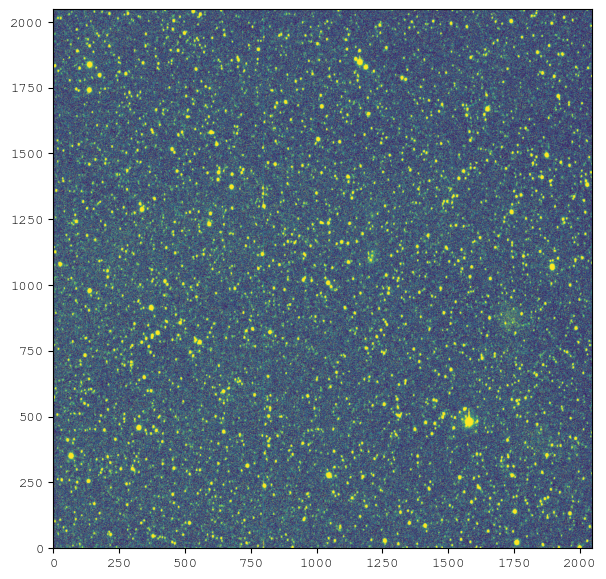

In [74]:
imshow(gal1_cube[0])

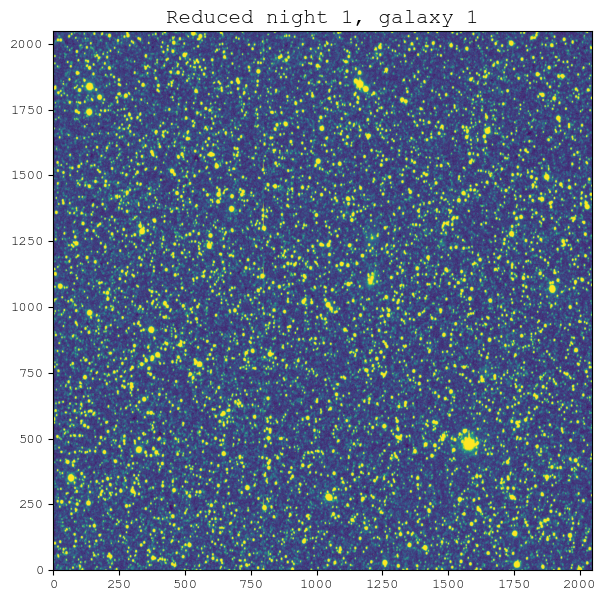

In [71]:
gal1_norm = reduce_data(gal1_cube, master_dark, master_flat)
imshow(gal1_norm[0], label='Reduced night 1, galaxy 1')

# Galaxy 2 data reduction

In [72]:
gal2_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/group2/raw/*.fit'
gal2_cube = load_data_cube(gal2_files)

100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 21.31it/s]


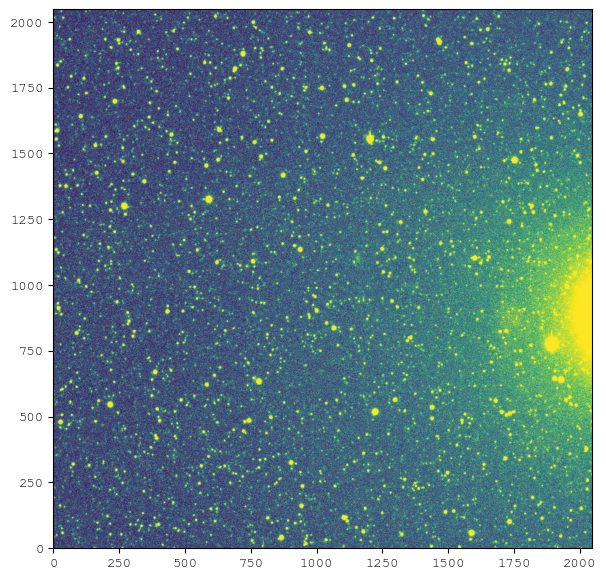

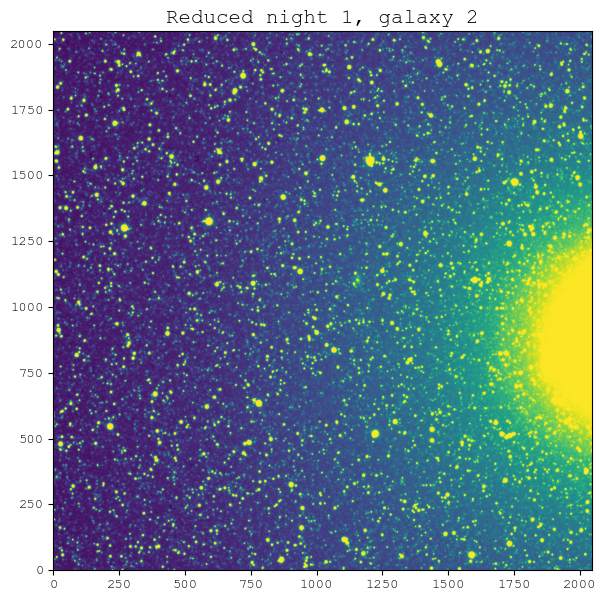

In [75]:
imshow(gal2_cube[0])

gal2_norm = reduce_data(gal2_cube, master_dark, master_flat)
imshow(gal2_norm[0], label='Reduced night 1, galaxy 2')

# Galaxy 3 data reduction

In [77]:
gal3_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/group3/*.fit'
gal3_cube = load_data_cube(gal3_files)

100%|█████████████████████████████████████████████| 9/9 [00:01<00:00,  8.57it/s]


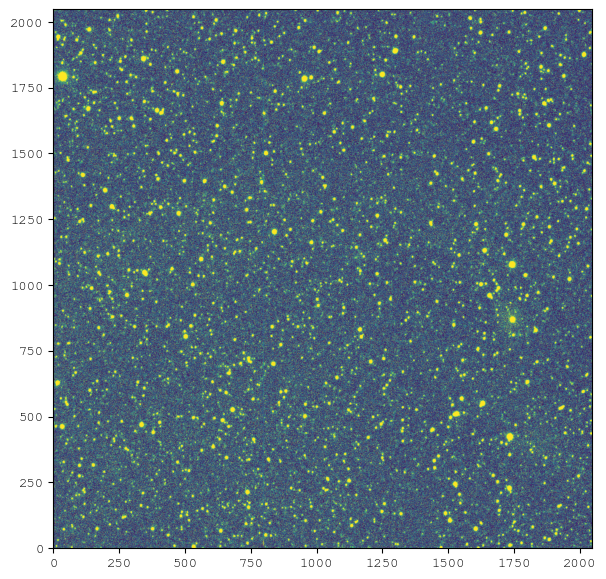

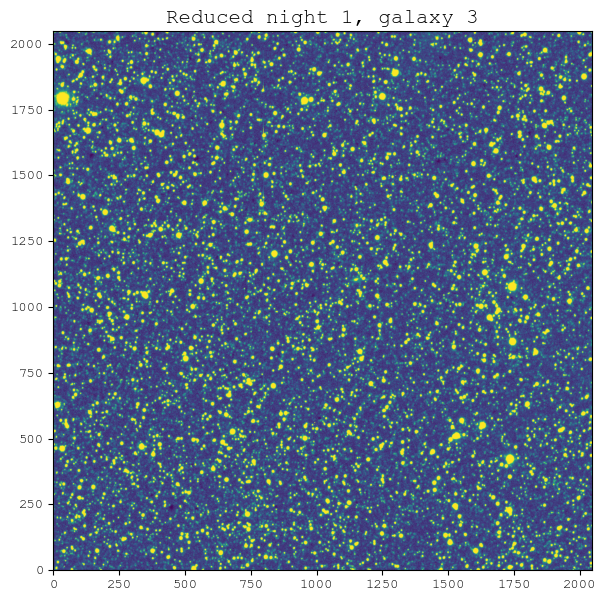

In [78]:
imshow(gal3_cube[0])

gal3_norm = reduce_data(gal3_cube, master_dark, master_flat)
imshow(gal3_norm[0], label='Reduced night 1, galaxy 3')

# Galaxy 4 data reduction

In [79]:
gal4_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/group4/*.fit'
gal4_cube = load_data_cube(gal4_files)

100%|█████████████████████████████████████████████| 9/9 [00:00<00:00, 22.13it/s]


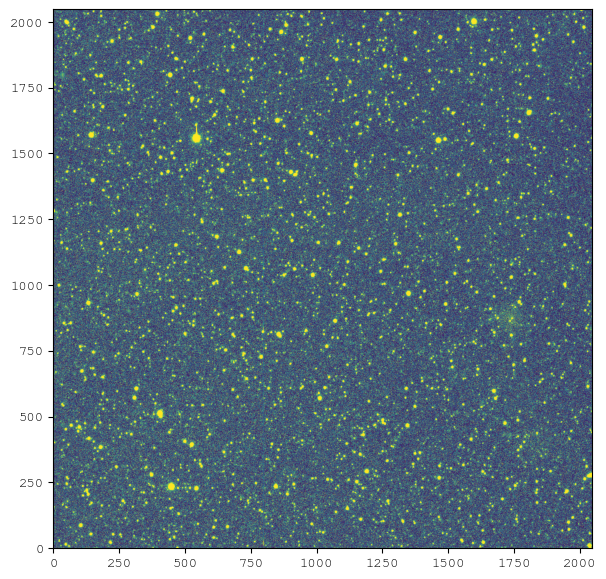

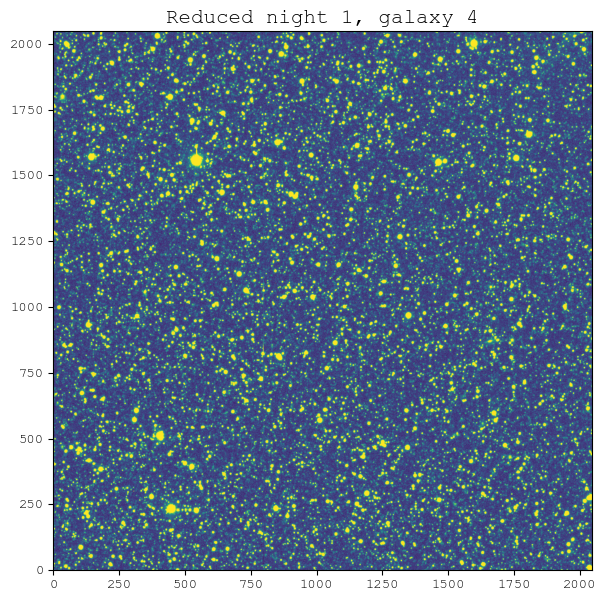

In [80]:
imshow(gal4_cube[0])

gal4_norm = reduce_data(gal4_cube, master_dark, master_flat)
imshow(gal4_norm[0], label='Reduced night 1, galaxy 4')

In [81]:
gal5_files = '/Volumes/MOAR/astrophysics/UNSJ/reduction_data/night1/group5/*.fit'
gal5_cube = load_data_cube(gal5_files)

100%|███████████████████████████████████████████| 10/10 [00:00<00:00, 22.08it/s]


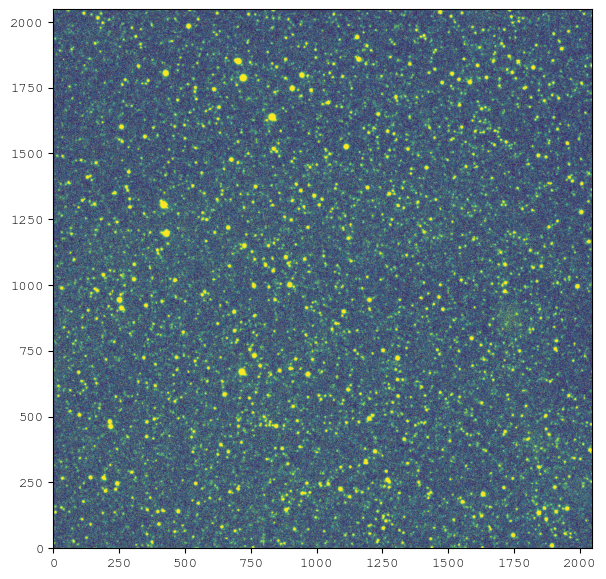

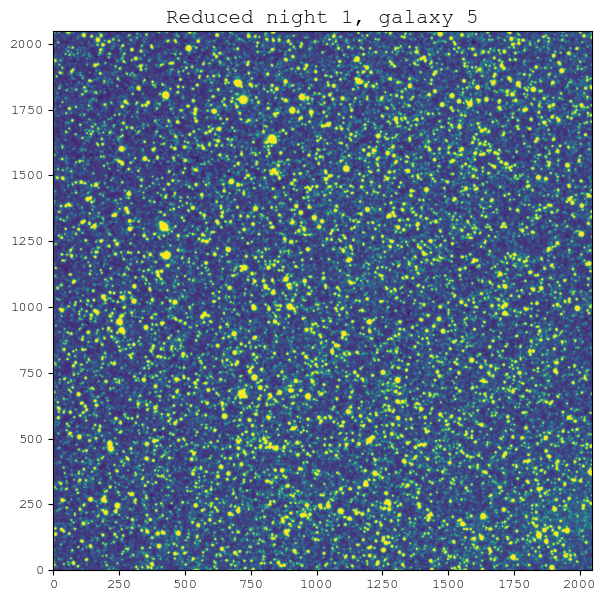

In [82]:
imshow(gal5_cube[0])

gal5_norm = reduce_data(gal5_cube, master_dark, master_flat)
imshow(gal5_norm[0], label='Reduced night 1, galaxy 5')